In [1]:
%matplotlib inline
import os
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import Dataset
from torch.optim import Adam
import torchvision
import torchvision.transforms as transforms

In /home/piyush/.conda/envs/kaggle/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/piyush/.conda/envs/kaggle/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/piyush/.conda/envs/kaggle/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In /home/piyush/.conda/envs/kaggle/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/piyush/.conda/e

In [2]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [3]:
class CityscapeDataset(Dataset):
    def __init__(self, data_dir, train=True, transform=None):
        self.data_dir = data_dir + ("train/" if train else "val/")
        self.transform = transform
        self.files = os.listdir(self.data_dir)

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        img = plt.imread(self.data_dir + self.files[idx])
        img = img[:, :256, :]
        if self.transform:
            img = self.transform(img)
        return img

In [4]:
batch_size = 64

transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
    ])

data_dir = "../data/cityscapes_data/"
trainset = CityscapeDataset(data_dir, train=True, transform=transform)
testset = CityscapeDataset(data_dir, train=False, transform=transform)

train_loader = torch.utils.data.DataLoader(trainset, batch_size=batch_size)
test_loader = torch.utils.data.DataLoader(testset, batch_size=batch_size)

In [5]:
class Decoder(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.deconv1 = nn.Sequential(
                        nn.ConvTranspose2d(64, 256, 4, 1, 0),
                        nn.ReLU(),
                        nn.BatchNorm2d(256)
                    )
        self.deconv2 = nn.Sequential(
                        nn.ConvTranspose2d(256, 256, 4, 2, 1),
                        nn.ReLU(),
                        nn.BatchNorm2d(256)
                    )
        self.deconv3 = nn.Sequential(
                        nn.ConvTranspose2d(256, 128, 4, 2, 1),
                        nn.ReLU(),
                        nn.BatchNorm2d(128)
                    )
        self.deconv4 = nn.Sequential(
                        nn.ConvTranspose2d(128, 128, 4, 2, 1),
                        nn.ReLU(),
                        nn.BatchNorm2d(128)
                    )
        self.deconv5 = nn.Sequential(
                        nn.ConvTranspose2d(128, 3, 4, 2, 1)
                    )

    def forward(self, x):
        x = self.deconv1(x)
        x = self.deconv2(x)
        x = self.deconv3(x)
        x = self.deconv4(x)
        x = self.deconv5(x)
        x = torch.tanh(x)
        return x

class Encoder(nn.Module):
    
    def __init__(self):
        super().__init__()
        
        self.conv1 = nn.Sequential(
                        nn.Conv2d(3, 128, 4, 2, 1),
                        nn.LeakyReLU(0.2)
                    )
        self.conv2 = nn.Sequential(
                        nn.Conv2d(128, 128, 4, 2, 1),
                        nn.LeakyReLU(0.2),
                        nn.BatchNorm2d(128)
                    )
        self.conv3 = nn.Sequential(
                        nn.Conv2d(128, 256, 4, 2, 1),
                        nn.LeakyReLU(0.2),
                        nn.BatchNorm2d(256)
                    )
        self.conv4 = nn.Sequential(
                        nn.Conv2d(256, 256, 4, 2, 1),
                        nn.LeakyReLU(0.2),
                        nn.BatchNorm2d(256)
                    )
        self.conv5 = nn.Sequential(
                        nn.Conv2d(256, 64, 4, 1, 0),
                        nn.LeakyReLU(0.2)
                    )

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        return x

In [6]:
def show_images(images, mean=0.5, stddev=0.5):
    # de-normalizing images
    images = images * stddev + mean
    img = np.array(images.tolist())
    # making numpy compatible image
    img = np.transpose(img, (1,2,0))
    plt.gcf().set_size_inches(10, 12)
    plt.imshow(img)
    plt.show()

## Autoencoder Training

In [7]:
E = Encoder()
E.to(device)

D = Decoder()
D.to(device)

lr = 1e-3
criterion = nn.MSELoss(reduction='mean')  # Or BCELoss - Both works
optimizer = Adam(list(E.parameters()) + list(D.parameters()), lr=lr)

Epoch: 1 	Training Loss: 0.1240


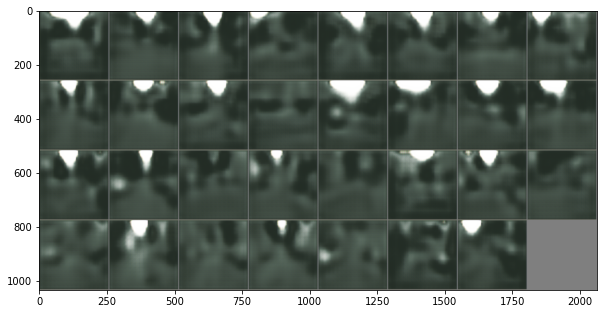

Epoch: 2 	Training Loss: 0.0569


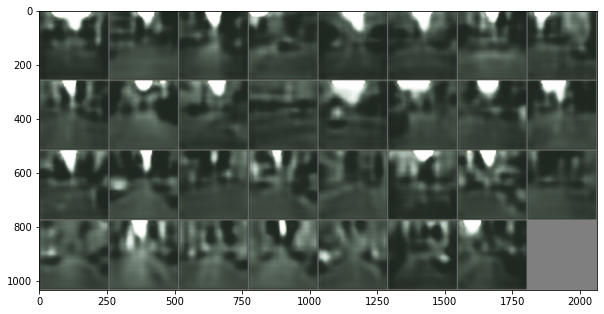

Epoch: 3 	Training Loss: 0.0498


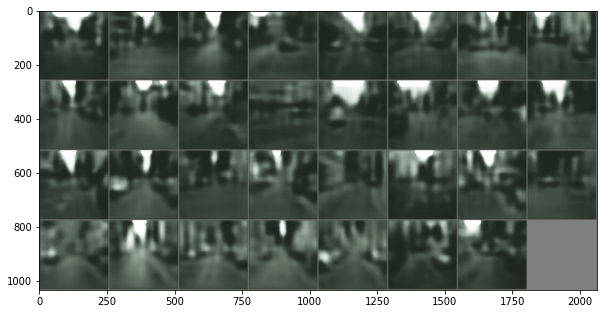

Epoch: 4 	Training Loss: 0.0441


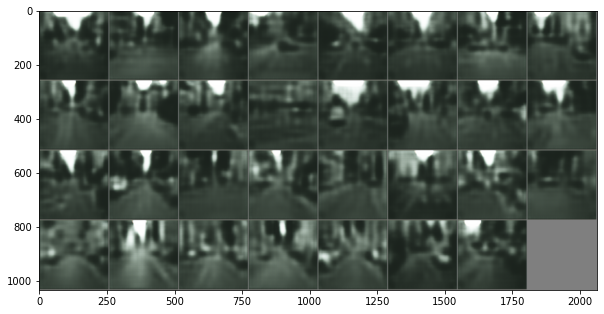

Epoch: 5 	Training Loss: 0.0413


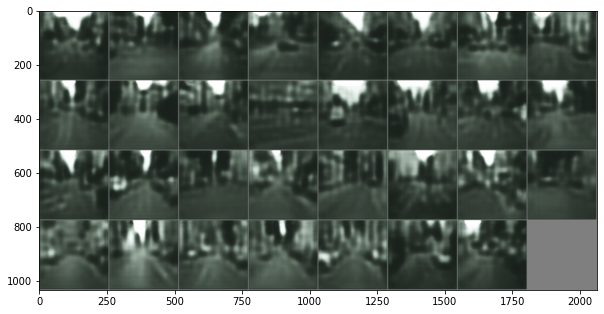

Epoch: 6 	Training Loss: 0.0385


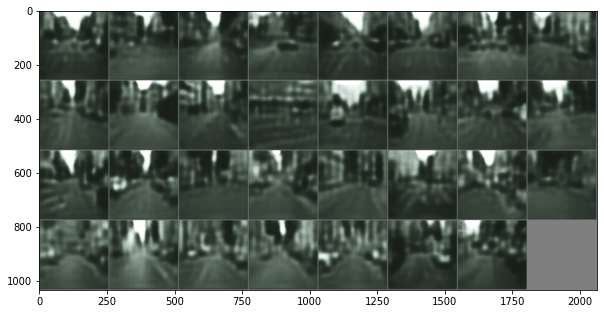

Epoch: 7 	Training Loss: 0.0363


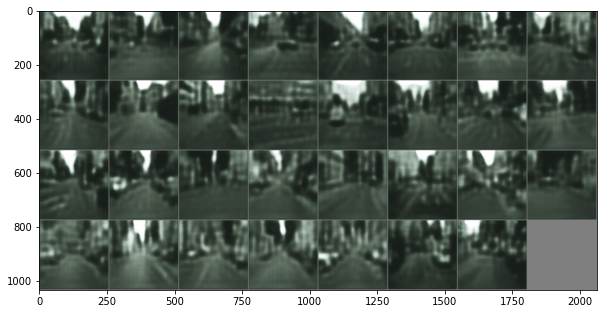

Epoch: 8 	Training Loss: 0.0349


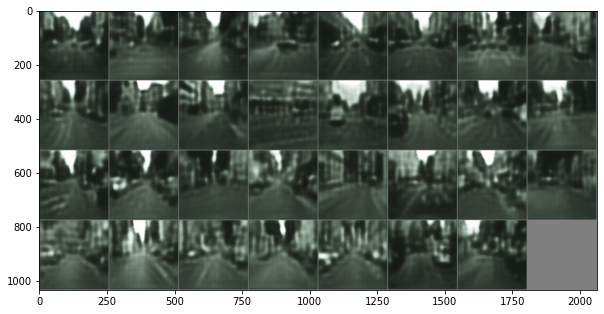

Epoch: 9 	Training Loss: 0.0331


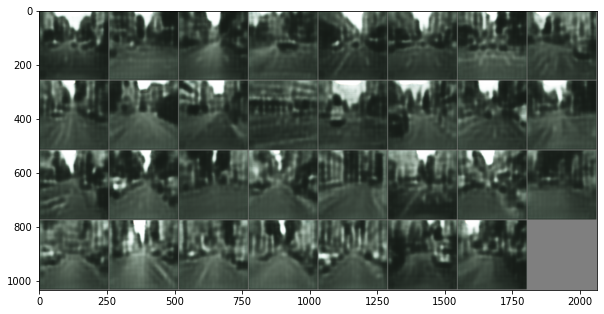

Epoch: 10 	Training Loss: 0.0315


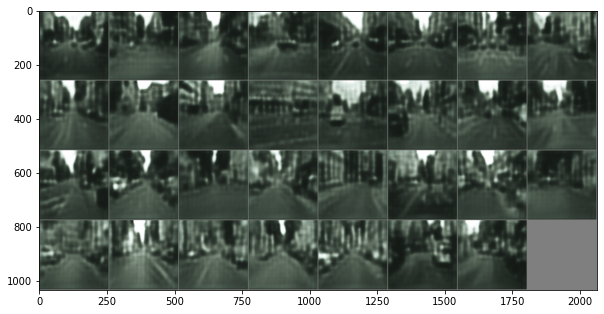

Epoch: 11 	Training Loss: 0.0308


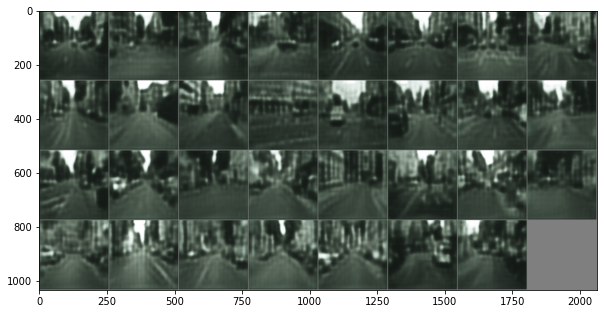

Epoch: 12 	Training Loss: 0.0298


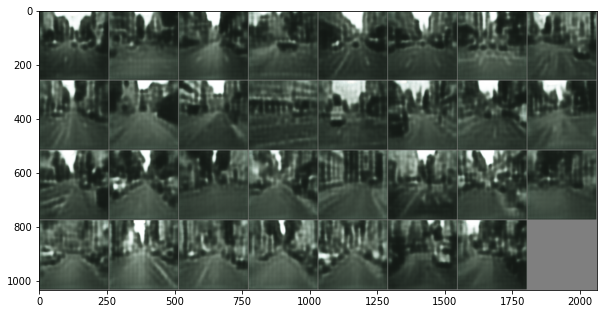

Epoch: 13 	Training Loss: 0.0292


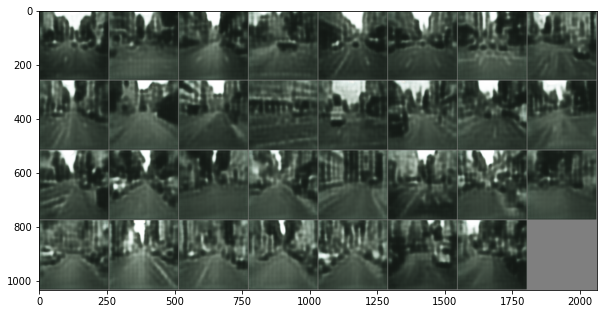

Epoch: 14 	Training Loss: 0.0286


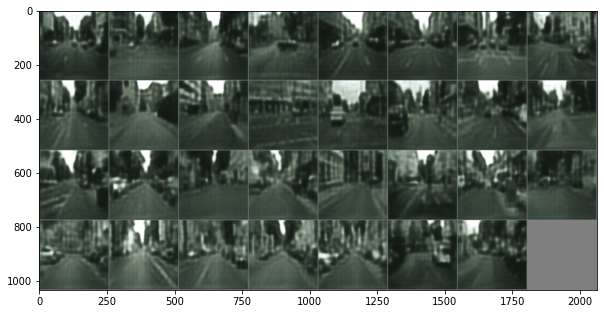

Epoch: 15 	Training Loss: 0.0280


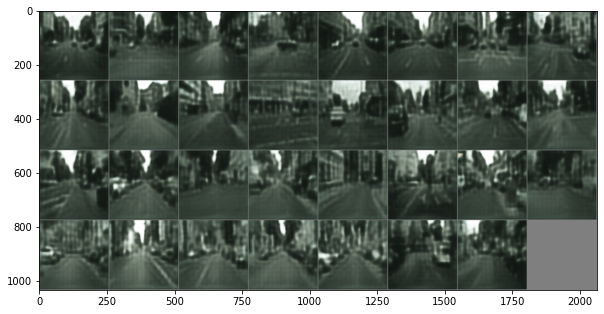

Epoch: 16 	Training Loss: 0.0271


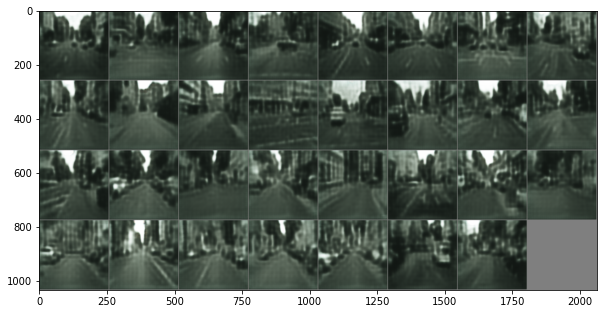

Epoch: 17 	Training Loss: 0.0266


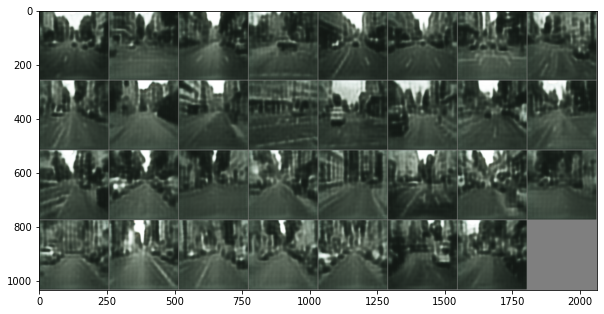

Epoch: 18 	Training Loss: 0.0261


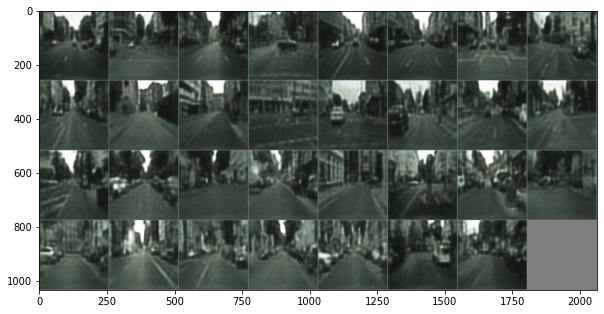

Epoch: 19 	Training Loss: 0.0258


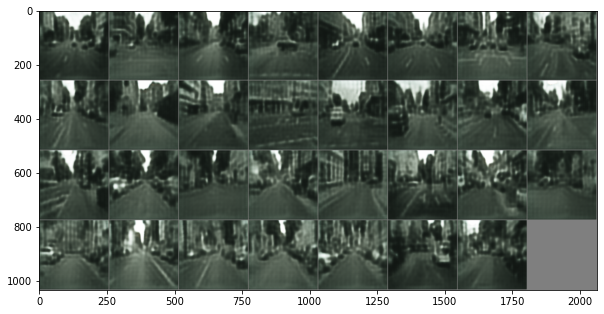

Epoch: 20 	Training Loss: 0.0252


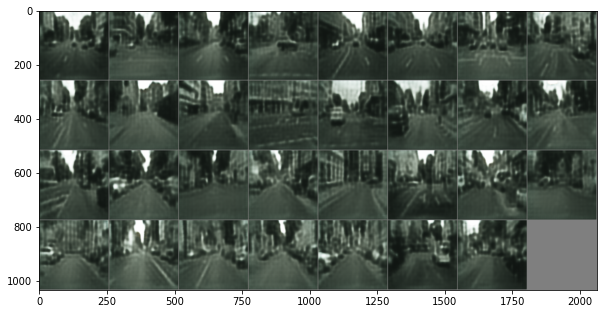

Epoch: 21 	Training Loss: 0.0246


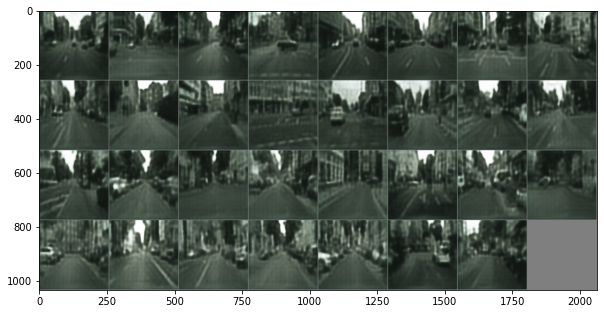

Epoch: 22 	Training Loss: 0.0244


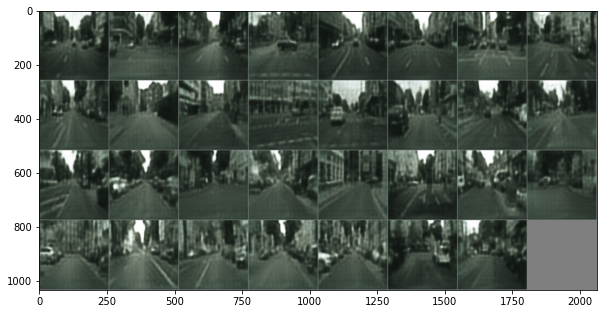

Epoch: 23 	Training Loss: 0.0240


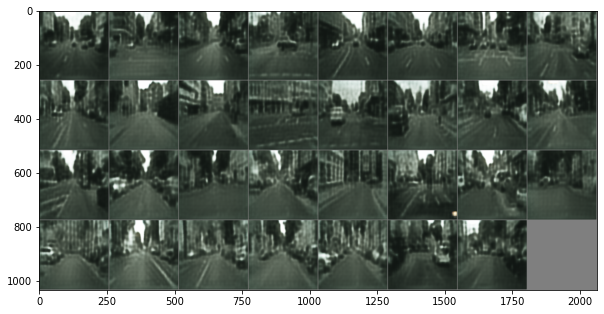

Epoch: 24 	Training Loss: 0.0236


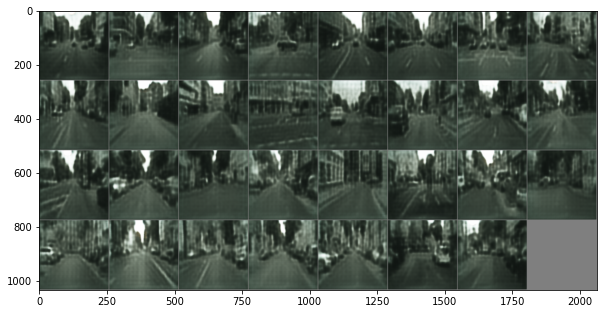

Epoch: 25 	Training Loss: 0.0231


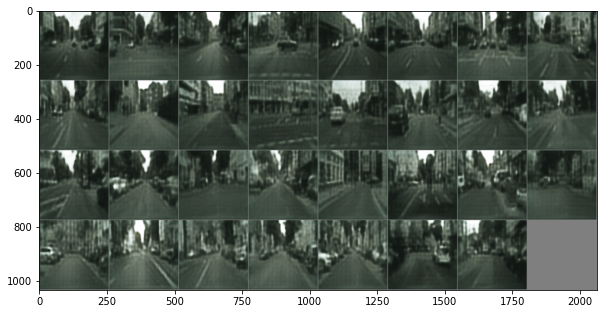

Epoch: 26 	Training Loss: 0.0248


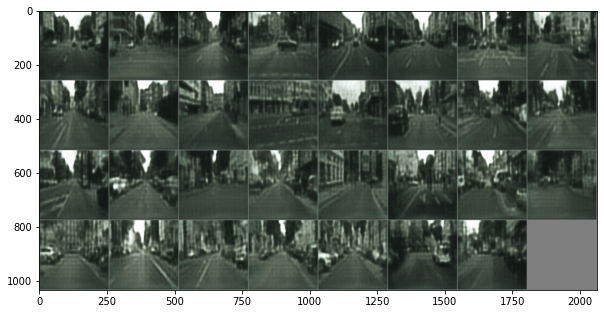

Epoch: 27 	Training Loss: 0.0236


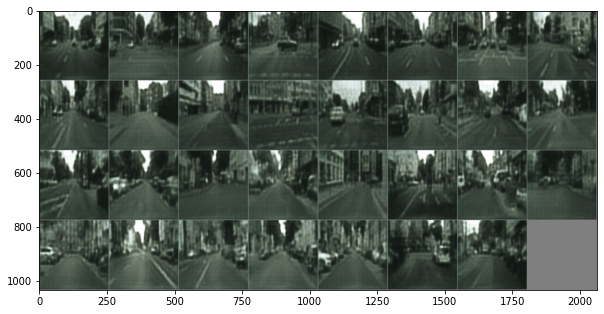

Epoch: 28 	Training Loss: 0.0230


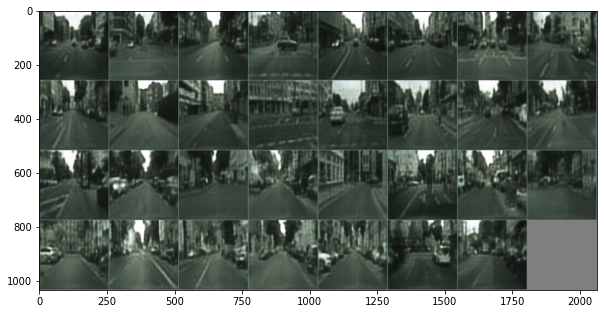

Epoch: 29 	Training Loss: 0.0224


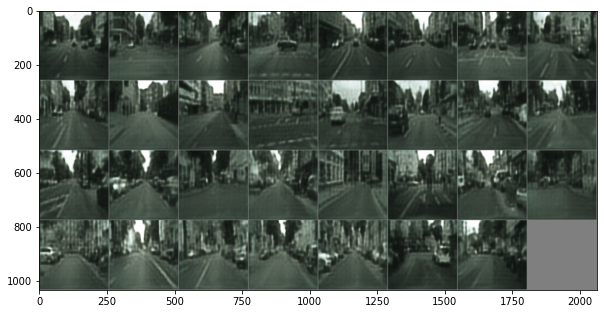

Epoch: 30 	Training Loss: 0.0219


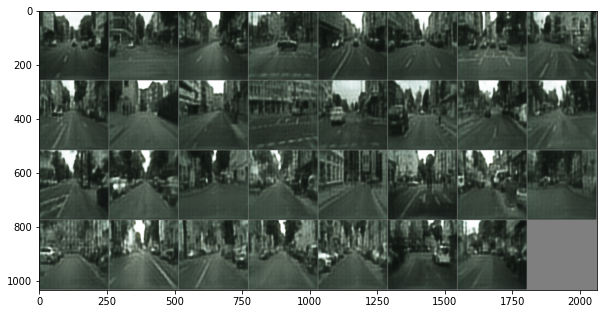

Epoch: 31 	Training Loss: 0.0234


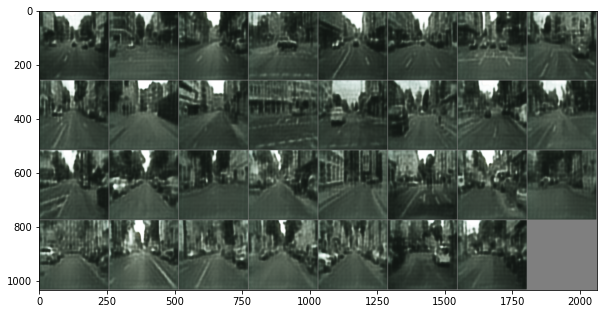

Epoch: 32 	Training Loss: 0.0231


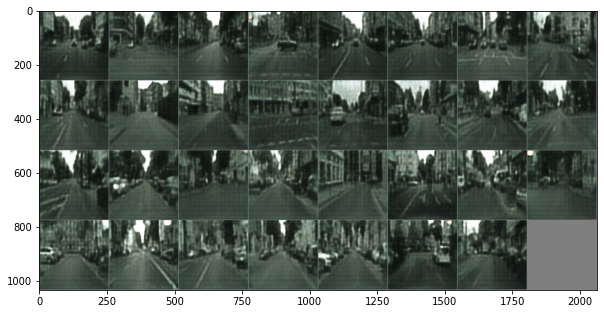

Epoch: 33 	Training Loss: 0.0236


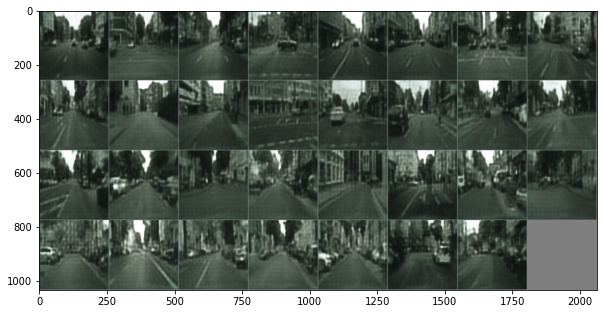

Epoch: 34 	Training Loss: 0.0221


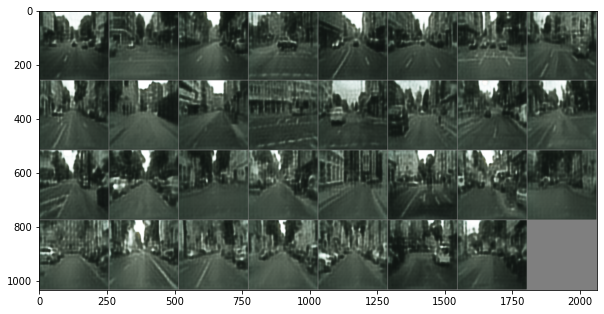

Epoch: 35 	Training Loss: 0.0216


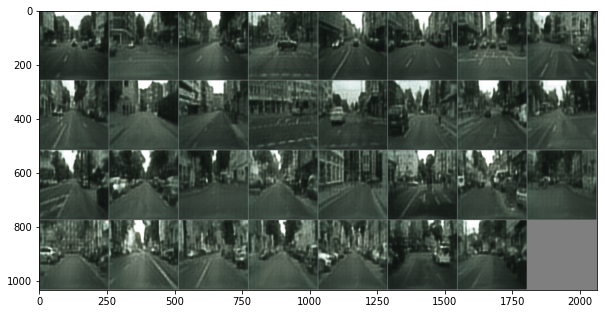

Epoch: 36 	Training Loss: 0.0206


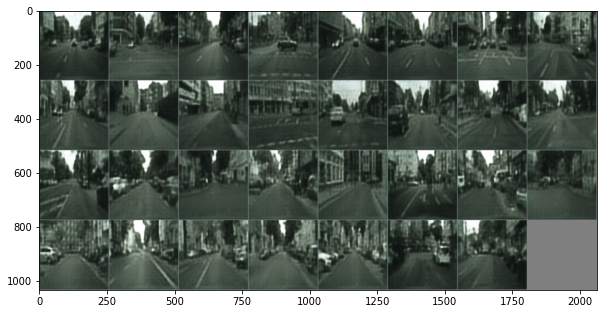

Epoch: 37 	Training Loss: 0.0214


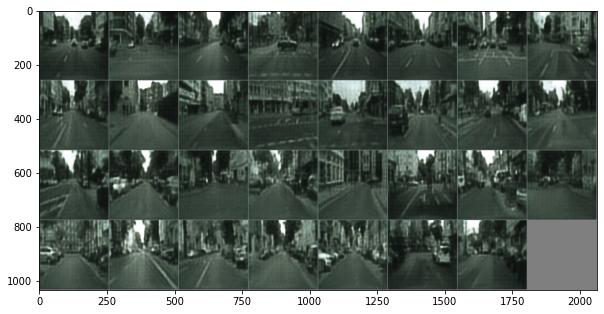

Epoch: 38 	Training Loss: 0.0195


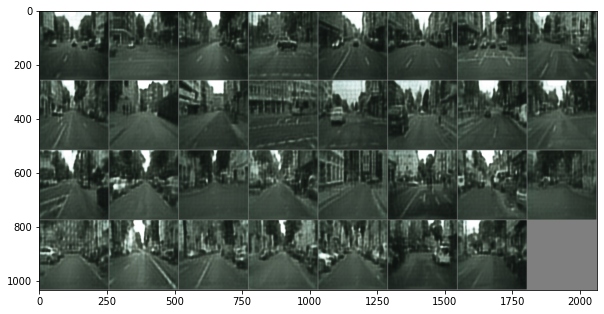

Epoch: 39 	Training Loss: 0.0214


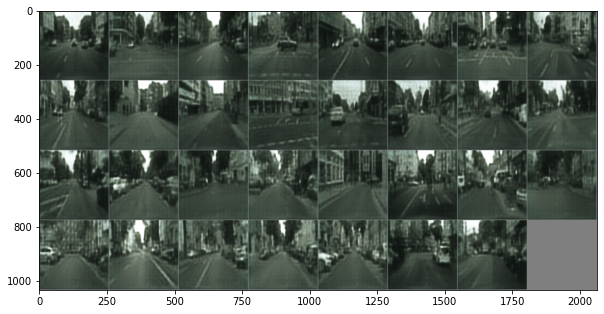

Epoch: 40 	Training Loss: 0.0206


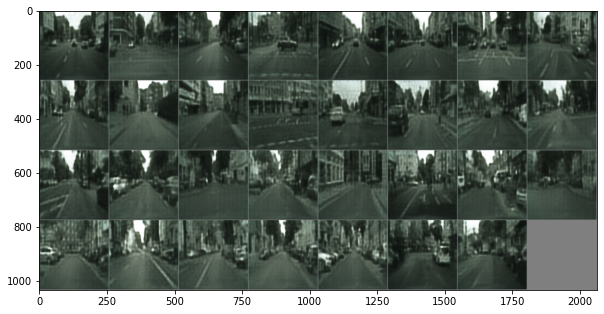

Epoch: 41 	Training Loss: 0.0197


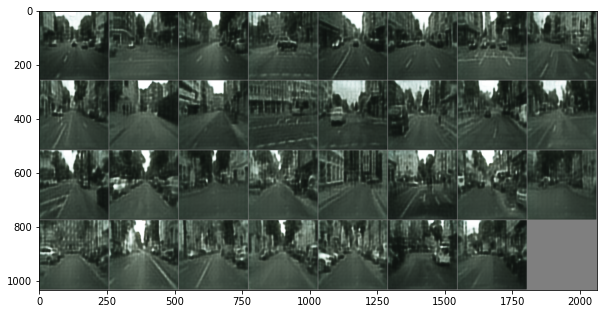

Epoch: 42 	Training Loss: 0.0203


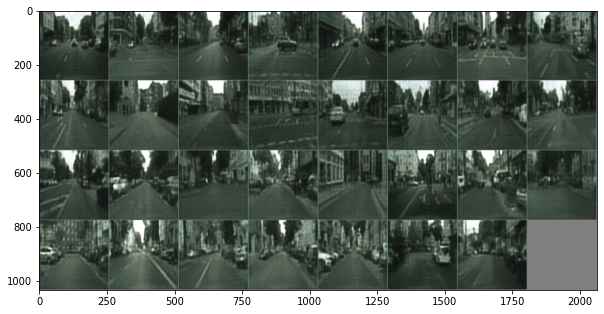

Epoch: 43 	Training Loss: 0.0204


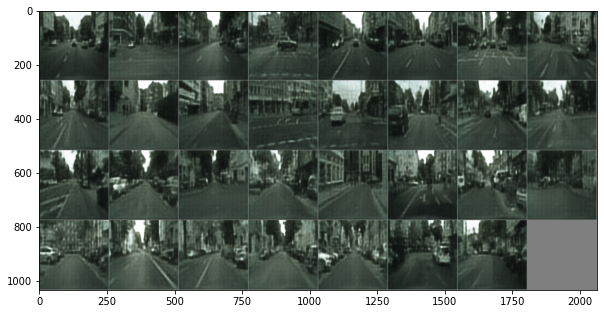

Epoch: 44 	Training Loss: 0.0196


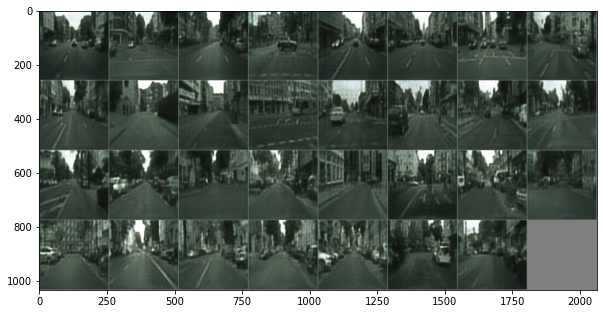

Epoch: 45 	Training Loss: 0.0190


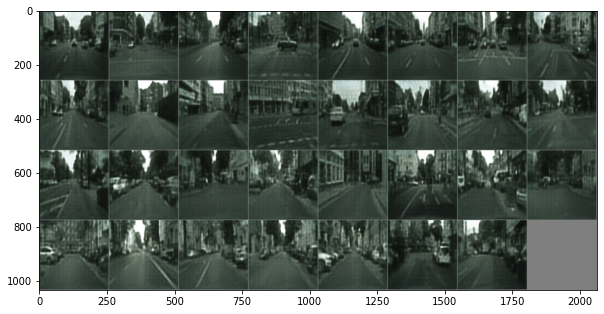

Epoch: 46 	Training Loss: 0.0200


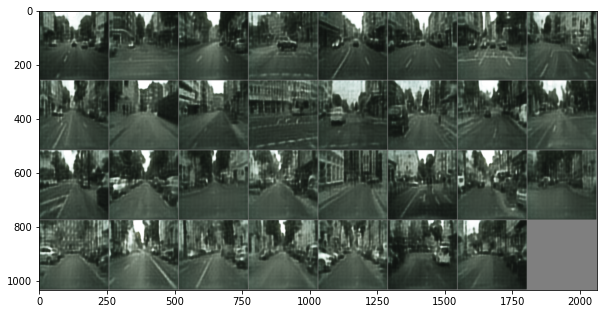

Epoch: 47 	Training Loss: 0.0209


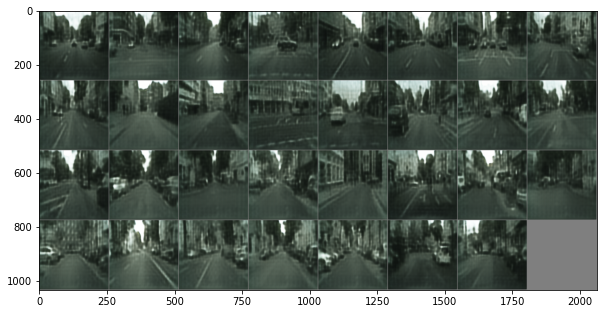

Epoch: 48 	Training Loss: 0.0202


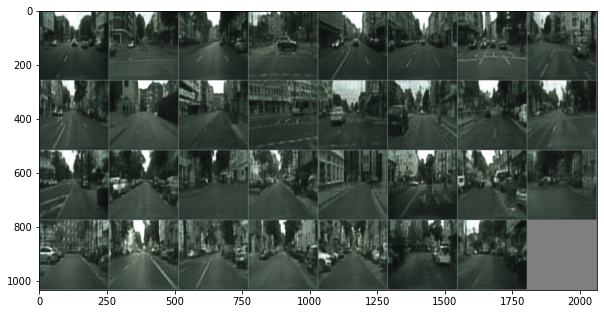

Epoch: 49 	Training Loss: 0.0191


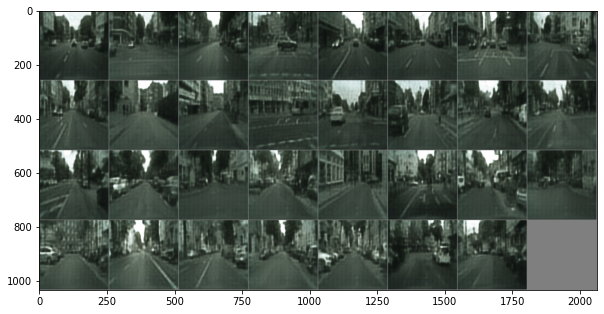

Epoch: 50 	Training Loss: 0.0183


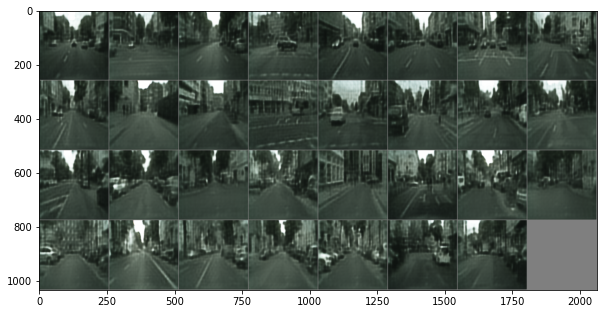

Epoch: 51 	Training Loss: 0.0202


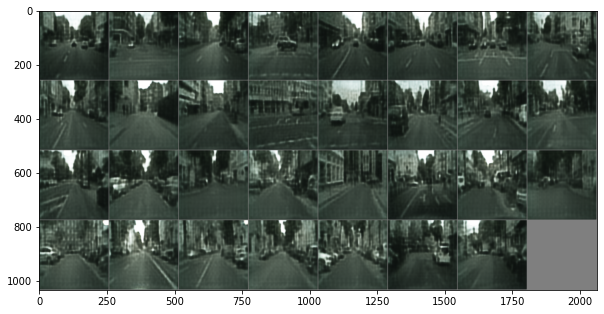

Epoch: 52 	Training Loss: 0.0194


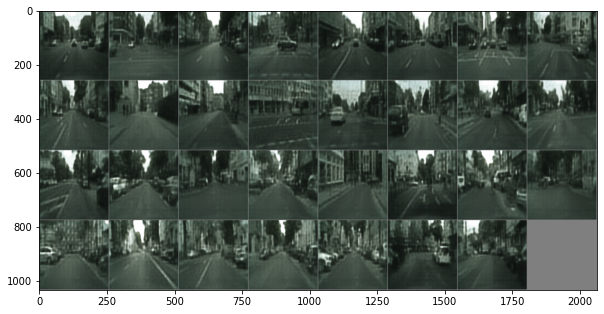

Epoch: 53 	Training Loss: 0.0184


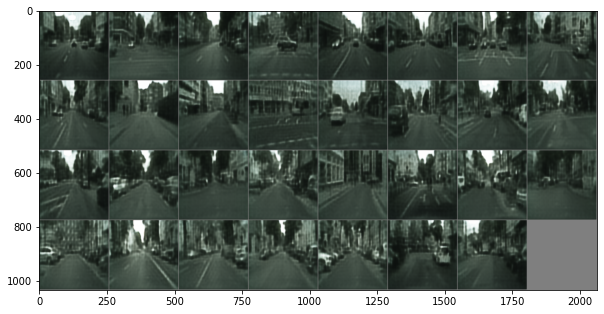

Epoch: 54 	Training Loss: 0.0197


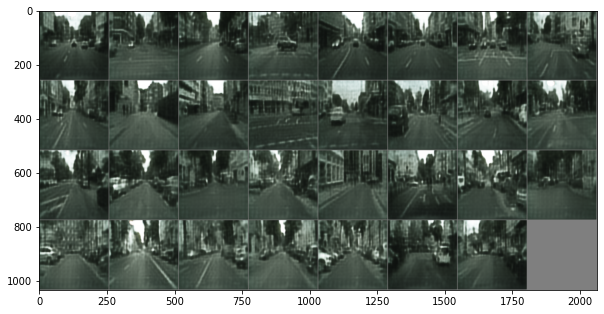

Epoch: 55 	Training Loss: 0.0200


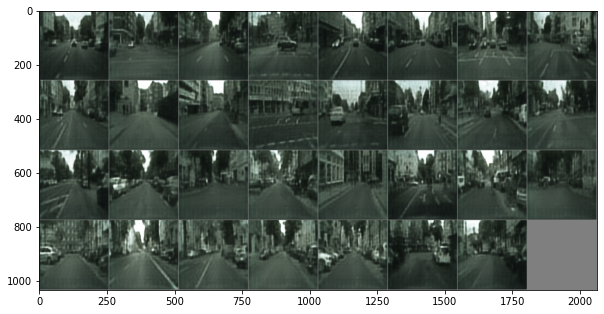

KeyboardInterrupt: 

In [8]:
n_epochs = 100
losses = []
for epoch in range(1, n_epochs+1):
    train_loss = 0.0
    E.train()
    D.train()
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        z = E(data)
#         print(z.shape)
        out_data = D(z)
        loss = criterion(out_data, data)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
    train_loss = train_loss/len(train_loader)
    losses.append(train_loss)

    print('Epoch: {} \tTraining Loss: {:.4f}'.format(epoch, train_loss))
    show_images(torchvision.utils.make_grid(out_data, 8))

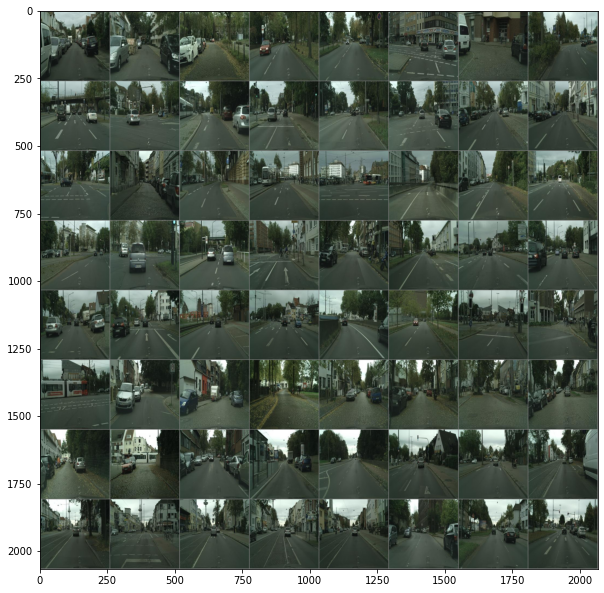

In [9]:
# Original images
show_images(torchvision.utils.make_grid(data, 8))

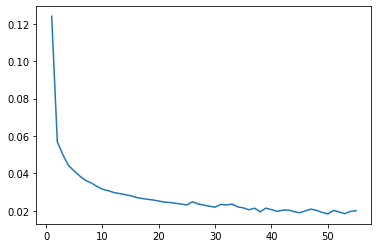

In [11]:
torch.save(E.state_dict(), "encoder.model")
torch.save(D.state_dict(), "decoder.model")
plt.plot(list(range(1, len(losses)+1)), losses)